In [1]:
import cv2
import time
import numpy as np
from matplotlib import pyplot as plt

# Question 1

---

#### 1. Implement an algorithm for low-pass filtering a grayscale image by moving a k × k averaging filter of the form ones $((k,k))/(k^2)$.

In [11]:
def mean_filter(im, k):
    im = np.int32(im)
    m, n = im.shape
    
    filt = np.ones((k, k))/(k**2)
    im = np.vstack((np.zeros(((k-1)//2, n+k-1)), np.hstack((np.zeros((m, (k-1)//2)), im, np.zeros((m, (k-1)//2)))), np.zeros(((k-1)//2, n+k-1))))
    
    ret = np.zeros((m, n), dtype=float)
    for i in range(m):
        for j in range(n):
            ret[i][j] = np.sum(filt * im[i:i+k, j:j+k])
            
    return np.uint8(ret)

The above function performs the function of averaging over the input image with a filter of size (k, k). We roll the filter accross the image and compute the average of intensity values of neighbourhoods of pixel.

#### 2. As the filter is moved from one spatial location to the next one, the filter window shares many common pixels in adjacent neighborhoods. Exploit this observation and implement a more efficient version of averaging filter.

In [12]:
def efficient_mean_filter(im, k):
    im = np.int32(im)
    m, n = im.shape
    
    filt = np.ones((k, k))/(k**2)
    im = np.vstack((np.zeros(((k-1)//2, n+k-1)), np.hstack((np.zeros((m, (k-1)//2)), im, np.zeros((m, (k-1)//2)))), np.zeros(((k-1)//2, n+k-1))))
    cum_sum = np.cumsum(np.cumsum(im, axis=0), axis=1)
    cum_sum = np.vstack((np.zeros((1, n+k)), np.hstack((np.zeros((m+k-1, 1)), cum_sum))))
    
    ret = np.zeros((m, n), dtype=float)
    for i in range(m):
        for j in range(n):
            ret[i][j] = (cum_sum[i+k][j+k] - (cum_sum[i][j+k] + cum_sum[i+k][j]) + cum_sum[i][j])/(k**2)

    return np.uint8(ret)

The above function performs the function of averaging over the input image with filter of size (k, k). We use the advantage of overlapping pixels to optimize the previous naive version of mean filter. We use the idea of cumulative sum to optimize the naive mean filter.

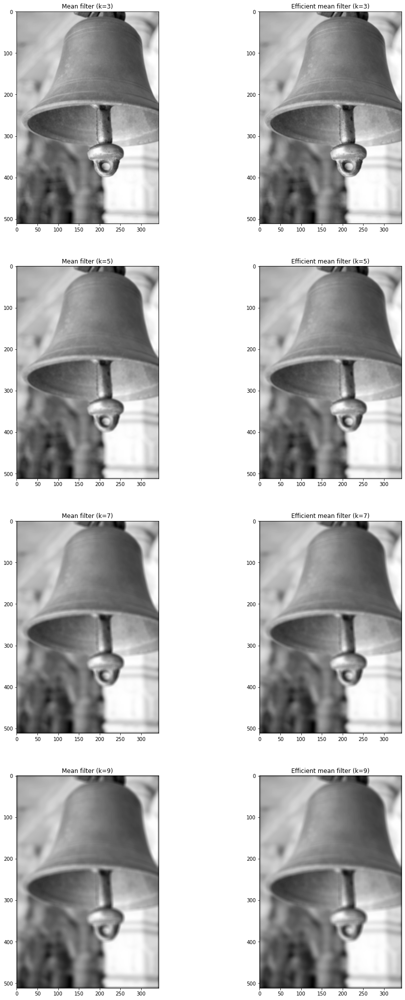

In [13]:
im = cv2.imread('../images/bell.jpg')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

fig = plt.figure(figsize=(16, 36))
ax1 = fig.add_subplot(4, 2, 1)
ax1.imshow(mean_filter(im, 3), cmap='gray')
ax1.set_title('Mean filter (k=3)')

ax2 = fig.add_subplot(4, 2, 2)
ax2.imshow(efficient_mean_filter(im, 3), cmap='gray')
ax2.set_title('Efficient mean filter (k=3)')

ax3 = fig.add_subplot(4, 2, 3)
ax3.imshow(mean_filter(im, 5), cmap='gray')
ax3.set_title('Mean filter (k=5)')

ax4 = fig.add_subplot(4, 2, 4)
ax4.imshow(efficient_mean_filter(im, 5), cmap='gray')
ax4.set_title('Efficient mean filter (k=5)')

ax5 = fig.add_subplot(4, 2, 5)
ax5.imshow(mean_filter(im, 7), cmap='gray')
ax5.set_title('Mean filter (k=7)')

ax6 = fig.add_subplot(4, 2, 6)
ax6.imshow(efficient_mean_filter(im, 7), cmap='gray')
ax6.set_title('Efficient mean filter (k=7)')

ax7 = fig.add_subplot(4, 2, 7)
ax7.imshow(mean_filter(im, 9), cmap='gray')
ax7.set_title('Mean filter (k=9)')

ax8 = fig.add_subplot(4, 2, 8)
ax8.imshow(efficient_mean_filter(im, 9), cmap='gray')
ax8.set_title('Efficient mean filter (k=9)')

plt.show()

#### 3. To appreciate the benefits of doing so, generate a plot of k vs run-time for various sized images.

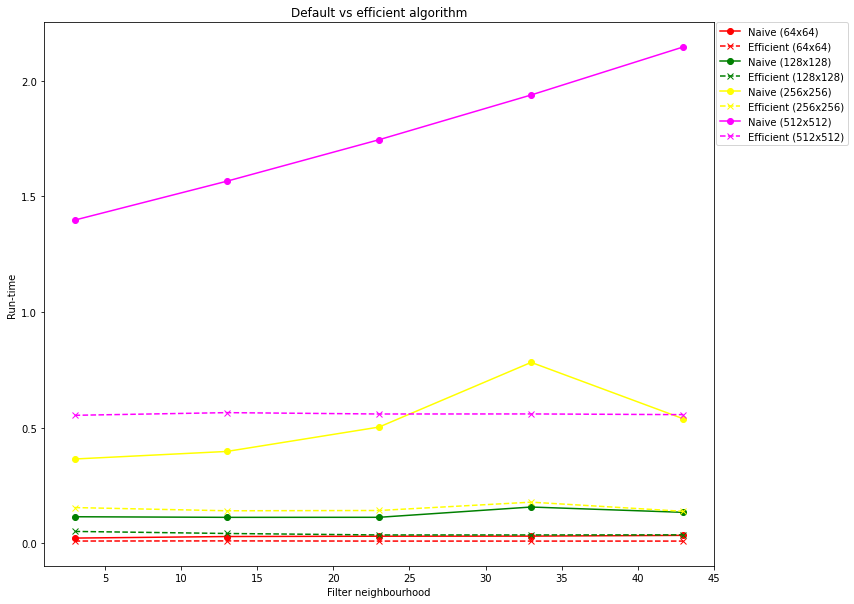

In [14]:
im64 = cv2.imread('../images/sunset.png')
im64 = cv2.cvtColor(im64, cv2.COLOR_BGR2GRAY)

im128 = cv2.imread('../images/fruit.png')
im128 = cv2.cvtColor(im128, cv2.COLOR_BGR2GRAY)

im256 = cv2.imread('../images/flowers.png')
im256 = cv2.cvtColor(im256, cv2.COLOR_BGR2GRAY)

im512 = cv2.imread('../images/lena.jpg')
im512 = cv2.cvtColor(im512, cv2.COLOR_BGR2GRAY)

imgs = [im64, im128, im256, im512]

px = []
time_arr = []
e_time_arr = []
for im in imgs:
    k = 3
    x = []
    t_arr = []
    et_arr = []
    while k < 50:
        cur_time = time.time()
        ret = mean_filter(im, k)
        t_arr.append(time.time() - cur_time)
        x.append(k)
        
        cur_time = time.time()
        ret = efficient_mean_filter(im, k)
        et_arr.append(time.time() - cur_time)
        
        k += 10
        
    time_arr.append(t_arr)
    e_time_arr.append(et_arr)
    px.append(x)
    
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(1, 1, 1)
l3, = ax.plot(px[0], time_arr[0], color='red', marker='o', linestyle='solid', label='Naive (64x64)')
l4, = ax.plot(px[0], e_time_arr[0], color='red', marker='x', linestyle='dashed', label='Efficient (64x64)')

l5, = ax.plot(px[1], time_arr[1], color='green', marker='o', linestyle='solid', label='Naive (128x128)')
l6, = ax.plot(px[1], e_time_arr[1], color='green', marker='x', linestyle='dashed', label='Efficient (128x128)')

l7, = ax.plot(px[2], time_arr[2], color='yellow', marker='o', linestyle='solid', label='Naive (256x256)')
l8, = ax.plot(px[2], e_time_arr[2], color='yellow', marker='x', linestyle='dashed', label='Efficient (256x256)')

l9, = ax.plot(px[3], time_arr[3], color='magenta', marker='o', linestyle='solid', label='Naive (512x512)')
l10, = ax.plot(px[3], e_time_arr[3], color='magenta', marker='x', linestyle='dashed', label='Efficient (512x512)')

ax.set_title('Default vs efficient algorithm')
ax.set_xlabel('Filter neighbourhood')
ax.set_ylabel('Run-time')
ax.legend(bbox_to_anchor=(1.20, 1), loc='upper right', borderaxespad=0.)

plt.show()

We can see from the above plot that proposed efficient mean filter is much more optimal than the naive mean filter. Infact, we can see from the plot that runtime of naive mean filter is increasing with the filter neighbourhood size, but runtime of efficient version is constant with neighbourhood size.

#### 4. Utilize the observation similar to above to implement an efficient version of a k × k median filter. Generate a plot figure similar to previous question.

In [15]:
def median_filter(im, k):
    im = np.int32(im)
    m, n = im.shape
    
    im = np.vstack((np.zeros(((k-1)//2, n+k-1)), np.hstack((np.zeros((m, (k-1)//2)), im, np.zeros((m, (k-1)//2)))), np.zeros(((k-1)//2, n+k-1))))
    
    ret = np.zeros((m, n))
    for i in range(m):
        for j in range(n):
            ret[i][j] = np.median(im[i:i+k, j:j+k])
            
    return np.uint8(ret)

The above function performs the function of median filter to remove noise from the image.

In [16]:
def efficient_median_filter(im, k):
    im = np.int32(im)
    m, n = im.shape
    
    im = np.vstack((np.zeros((k//2, n+k-1)), np.hstack((np.zeros((m, k//2)), im, np.zeros((m, k//2)))), np.zeros((k//2, n+k-1))))
    im = np.int32(im)
    
    middle = ((k**2)+1)//2
    ret = np.zeros((m, n))
    
    for i in range(m):
        for j in range(n):
            if j == 0:
                temp = np.zeros(256)
                uni, cnt = np.unique(im[i:i+k, :k], return_counts=True)
                temp[uni] = cnt
            if j != 0:
                uni, cnt = np.unique(im[i:i+k, j-1], return_counts=True)
                temp[uni] -= cnt
                
                uni, cnt = np.unique(im[i:i+k, j+k-1], return_counts=True)
                temp[uni] += cnt
                
            cum_sum = np.cumsum(temp)
            ret[i][j] = np.searchsorted(cum_sum, middle)
    
    return np.uint8(ret)

The above function performs the function of median filter which is more efficient than previous naive median filter. We use the idea of frequency count of pixel values of kxk grid on image. However, we can see that for smaller filter sizes, the runtime of efficient median filter is little higher than naive median filter. But with larger filter sizes, efficient median filter obviously performs much better than naive median filter.

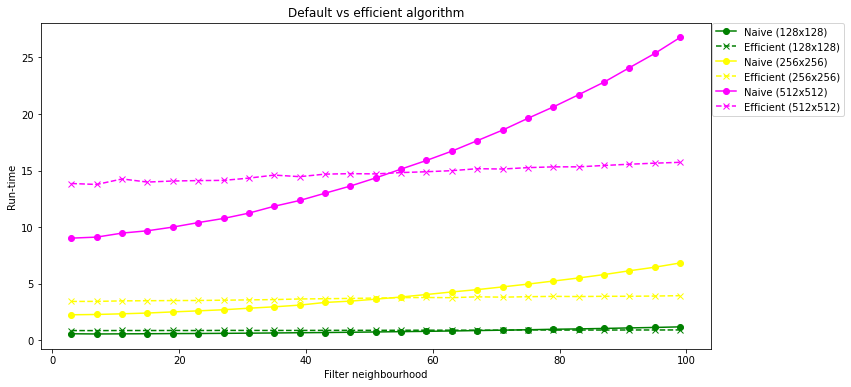

In [17]:
im128 = cv2.imread('../images/fruit.png')
im128 = cv2.cvtColor(im128, cv2.COLOR_BGR2GRAY)

im256 = cv2.imread('../images/flowers.png')
im256 = cv2.cvtColor(im256, cv2.COLOR_BGR2GRAY)

im512 = cv2.imread('../images/lena.jpg')
im512 = cv2.cvtColor(im512, cv2.COLOR_BGR2GRAY)

imgs = [im128, im256, im512]

px = []
time_arr = []
e_time_arr = []
for im in imgs:
    k = 3
    x = []
    t_arr = []
    et_arr = []
    while k < 100:
        cur_time = time.time()
        ret = median_filter(im, k)
        t_arr.append(time.time() - cur_time)
        x.append(k)
        
        cur_time = time.time()
        ret = efficient_median_filter(im, k)
        et_arr.append(time.time() - cur_time)
        
        k += 4
        
    time_arr.append(t_arr)
    e_time_arr.append(et_arr)
    px.append(x)
    
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(1, 1, 1)
ax.plot(px[0], time_arr[0], color='green', marker='o', linestyle='solid', label='Naive (128x128)')
ax.plot(px[0], e_time_arr[0], color='green', marker='x', linestyle='dashed', label='Efficient (128x128)')

ax.plot(px[1], time_arr[1], color='yellow', marker='o', linestyle='solid', label='Naive (256x256)')
ax.plot(px[1], e_time_arr[1], color='yellow', marker='x', linestyle='dashed', label='Efficient (256x256)')

ax.plot(px[2], time_arr[2], color='magenta', marker='o', linestyle='solid', label='Naive (512x512)')
ax.plot(px[2], e_time_arr[2], color='magenta', marker='x', linestyle='dashed', label='Efficient (512x512)')

ax.set_title('Default vs efficient algorithm')
ax.set_xlabel('Filter neighbourhood')
ax.set_ylabel('Run-time')
ax.legend(bbox_to_anchor=(1.20, 1), loc='upper right', borderaxespad=0.)

plt.show()

We can see from the above plot that initially with smaller filter sizes, naive median filter works better because of numpy optimizations. But later with bigger filter sizes, efficient median filter performs much better. Infact the runtime of naive median filter is increasing with filter size, but it is almost constant in the case of efficient median filter.

#### 5. Using the denoising concepts discussed in the class, try to remove noise from "Noisy.jpg"

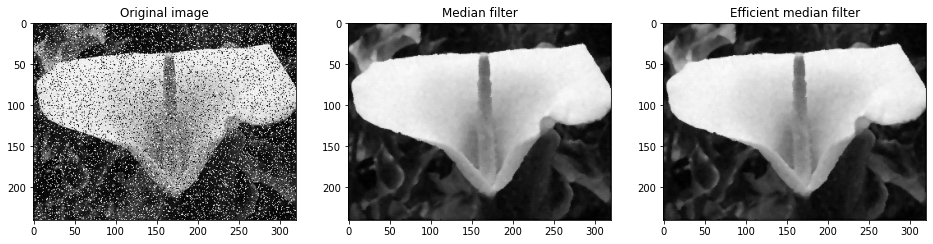

In [18]:
im = cv2.imread('../images/Noisy.jpg')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

fig = plt.figure(figsize=(16, 24))
ax = fig.add_subplot(1, 3, 1)
ax.imshow(im, cmap='gray')
ax.set_title('Original image')

ax = fig.add_subplot(1, 3, 2)
ret = median_filter(im, 5)
ax.imshow(ret, cmap='gray')
ax.set_title('Median filter')

ax = fig.add_subplot(1, 3, 3)
ret = efficient_median_filter(im, 5)
ax.imshow(ret, cmap='gray')
ax.set_title('Efficient median filter')

plt.show()

Removed noise from input image with naive median filter and efficient median filter.

# Question 2 (Edge Detection)

---

#### 1. Read about Canny Edge detector. Apply the Canny edge detector (use inbuilt cv2.Canny function for this task) to bell.jpg.

##### Canny edge detector

It is a multistage implementation filter.
* Gaussian smoothing - Remove noise to avoid unnecessary edges
* Intensity gradient - Sobel filter to get first order derivative across x and y directions, from which gradient and direction are found
* Non-maximum suppression - All pixels on edge are checked for if they are minima or maxima along the direction of slope. If not satisfied, they are not conidered as edges
* Hysteresis thresholding - If an edge has magnitude greater than maxVal, it is surely as edge. If an edge has magnitude lesser than minVal, then it is surely not edge. Values b/w minVal and maxVal are chosen as edge or not depending on whether they are connected to a sure edge or not

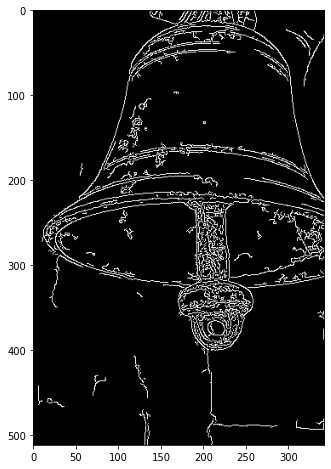

In [19]:
im = cv2.imread('../images/bell.jpg')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

ret = cv2.Canny(im, 30, 100)

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 1, 1)
axs.imshow(ret, cmap='gray')

plt.show()

#### 2. Tweak the values of the arguments (minVal and maxVal ), and report the values that give the best results for each image.

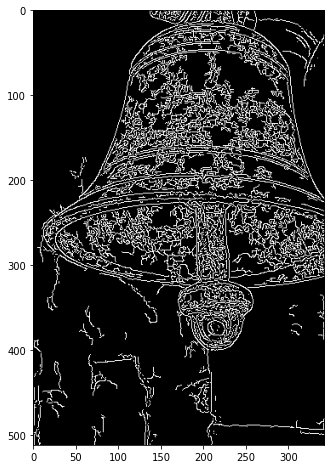

In [20]:
ret = cv2.Canny(im, 0, 70)

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 1, 1)
axs.imshow(ret, cmap='gray')

plt.show()

Best values obtained while detecting as many edges in bell as possible, while avoiding edges in the background,

*minVal: 0*\
*maxVal: 70*

#### 3. Consider Roberts, Prewitt, Sobel and Laplacian filters discussed in the class. Implement and apply these filters on kobe.png and make observations upon comparing their outputs. Compare these with the output of Canny edge detector on the same image.

In [2]:
def func(im, filt1, filt2):
    im = np.int32(im)
    m, n = im.shape
    fm, fn = filt1.shape
    
    if fm % 2 == 0:
        im = np.vstack((np.zeros(((fm-1)//2, n+fn-2)), np.hstack((np.zeros((m, (fn-1)//2)), im, np.zeros((m, (fn-1)//2)))), np.zeros(((fm-1)//2, n+fn-2))))
        im = np.vstack((im, np.zeros((1, n+fn-2))))
        im = np.hstack((im, np.zeros((m+fm-1, 1))))
    else:
        im = np.vstack((np.zeros(((fm-1)//2, n+fn-1)), np.hstack((np.zeros((m, (fn-1)//2)), im, np.zeros((m, (fn-1)//2)))), np.zeros(((fm-1)//2, n+fn-1))))
        
    ret = np.zeros((m, n))
    for i in range(m):
        for j in range(n):
            ret[i][j] = np.round(np.sqrt(np.sum(filt1 * im[i:i+fm, j:j+fn])**2 + np.sum(filt2 * im[i:i+fm, j:j+fn])**2))
            
    return np.uint8(ret)

In [3]:
def func1(im, filt):
    im = np.int32(im)
    m, n = im.shape
    fm, fn = filt.shape
    
    im = np.vstack((np.zeros(((fm-1)//2, n+fn-1)), np.hstack((np.zeros((m, (fn-1)//2)), im, np.zeros((m, (fn-1)//2)))), np.zeros(((fm-1)//2, n+fn-1))))
    ret = np.zeros((m, n))
    for i in range(m):
        for j in range(n):
            ret[i][j] = np.sum(filt * im[i:i+fm, j:j+fn])
            
    return np.uint8(ret)

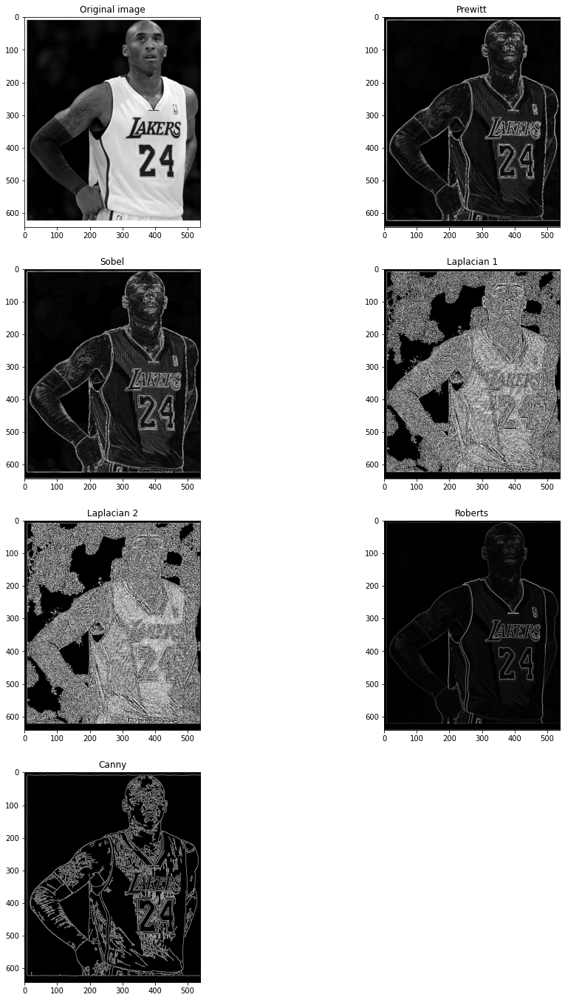

In [4]:
im = cv2.imread('../images/kobe.png')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

roberts_x = np.array([[0, 1], [-1, 0]])
roberts_y = np.array([[1, 0], [0, -1]])
prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
prewitt_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
laplacian_1 = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
laplacian_2 = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]])

fig = plt.figure(figsize=(16, 24))
ax = fig.add_subplot(4, 2, 1)
ax.imshow(im, cmap='gray')
ax.set_title('Original image')

ax1 = fig.add_subplot(4, 2, 2)
prewitt = func(im, prewitt_x, prewitt_y)
ax1.imshow(prewitt, cmap='gray')
ax1.set_title('Prewitt')

ax2 = fig.add_subplot(4, 2, 3)
sobel = func(im, sobel_x, sobel_y)
ax2.imshow(sobel, cmap='gray')
ax2.set_title('Sobel')

ax3 = fig.add_subplot(4, 2, 4)
laplacian1 = func1(im, laplacian_1)
ax3.imshow(laplacian1, cmap='gray')
ax3.set_title('Laplacian 1')

ax4 = fig.add_subplot(4, 2, 5)
laplacian2 = func1(im, laplacian_2)
ax4.imshow(laplacian2, cmap='gray')
ax4.set_title('Laplacian 2')

ax4 = fig.add_subplot(4, 2, 6)
roberts = func(im, roberts_x, roberts_y)
ax4.imshow(roberts, cmap='gray')
ax4.set_title('Roberts')

ax5 = fig.add_subplot(4, 2, 7)
canny = cv2.Canny(im, 30, 100)
ax5.imshow(canny, cmap='gray')
ax5.set_title('Canny')

plt.show()

##### Observations
* We can see that prewitt and sobel filters work well for visible edges, but fail for feeble edges.
* Roberts filter is much more sensitive to clear visible edges. Feeble edges are not at all found.
* Laplacian filters have more noise.
* Canny filter finds most of the edges (clearly visible or feeble) based on input parameters (minVal and maxVal). Hence, we can control the extent of sensitivity of finding edges with canny filter.

#### 4. What will the 5×5 variants of Sobel and Prewitt filters look like? Apply these larger filters on kobe.png and make observations upon comparing their outputs with the corresponding smaller filters.

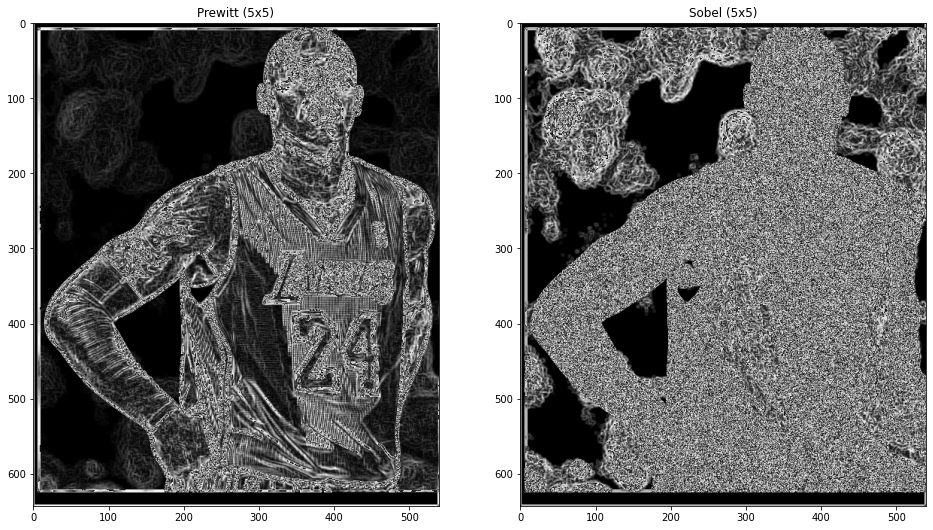

In [5]:
sobel_5x = np.array([[-5, -4, 0, 4, 5], [-8, -10, 0, 10, 8], [-10, -20, 0, 20, 10], [-8, -10, 0, 10, 8], [-5, -4, 0, 4, 5]])
sobel_5y = np.array([[-5, -8, -10, -8, -5], [-4, -10, -20, -10, -4], [0, 0, 0, 0, 0], [4, 10, 20, 10, 4], [5, 8, 10, 8, 5]])
prewitt_5x = np.array([[-1, -2, 0, 2, 1], [-1, -2, 0, 2, 1], [-1, -2, 0, 2, 1], [-1, -2, 0, 2, 1], [-1, -2, 0, 2, 1]])
prewitt_5y = np.array([[1, 1, 1, 1, 1], [2, 2, 2, 2, 2], [0, 0, 0, 0, 0], [-2, -2, -2, -2, -2], [-1, -1, -1, -1, -1]])

fig = plt.figure(figsize=(16, 24))
ax1 = fig.add_subplot(2, 2, 1)
prewitt = func(im, prewitt_5x, prewitt_5y)
ax1.imshow(prewitt, cmap='gray')
ax1.set_title('Prewitt (5x5)')

ax2 = fig.add_subplot(2, 2, 2)
sobel = func(im, sobel_5x, sobel_5y)
ax2.imshow(sobel, cmap='gray')
ax2.set_title('Sobel (5x5)')

plt.show()

#### 5. Add noise to the input image above using Gaussian sampling. Study the effect of applying the above filters(from 2 nd part) on noise-affected inputs.

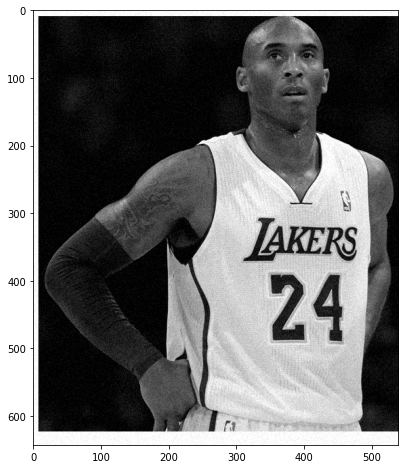

In [6]:
np.random.seed(seed = 1234567)
noise = np.random.normal(0, 10, im.shape)
noisy_im = np.int32(im) + noise
noisy_im[noisy_im < 0] = 0
noisy_im[noisy_im > 255] = 255
noisy_im = np.uint8(noisy_im)

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 1, 1)
axs.imshow(noisy_im, cmap='gray')

plt.show()

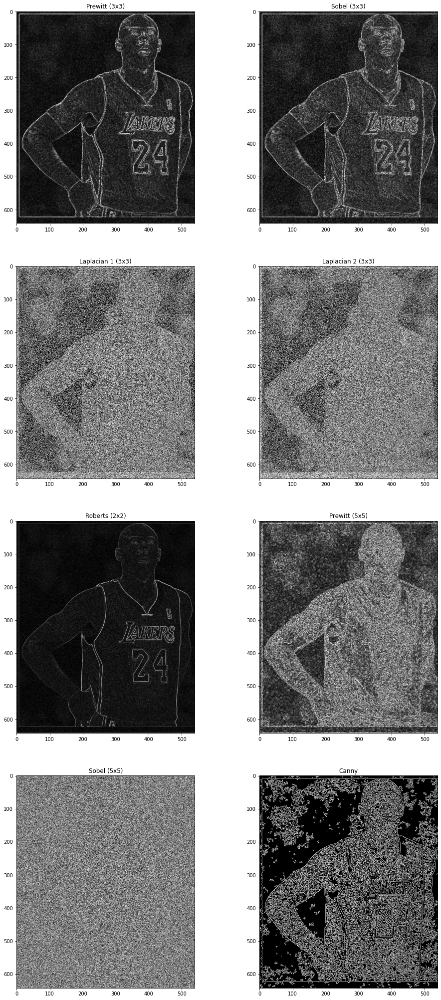

In [7]:
fig = plt.figure(figsize=(16, 36))
ax1 = fig.add_subplot(4, 2, 1)
prewitt = func(noisy_im, prewitt_x, prewitt_y)
ax1.imshow(prewitt, cmap='gray')
ax1.set_title('Prewitt (3x3)')

ax2 = fig.add_subplot(4, 2, 2)
sobel = func(noisy_im, sobel_x, sobel_y)
ax2.imshow(sobel, cmap='gray')
ax2.set_title('Sobel (3x3)')

ax3 = fig.add_subplot(4, 2, 3)
laplacian1 = func1(noisy_im, laplacian_1)
ax3.imshow(laplacian1, cmap='gray')
ax3.set_title('Laplacian 1 (3x3)')

ax4 = fig.add_subplot(4, 2, 4)
laplacian2 = func1(noisy_im, laplacian_2)
ax4.imshow(laplacian2, cmap='gray')
ax4.set_title('Laplacian 2 (3x3)')

ax5 = fig.add_subplot(4, 2, 5)
roberts = func(noisy_im, roberts_x, roberts_y)
ax5.imshow(roberts, cmap='gray')
ax5.set_title('Roberts (2x2)')

ax6 = fig.add_subplot(4, 2, 6)
prewitt5 = func(noisy_im, prewitt_5x, prewitt_5y)
ax6.imshow(prewitt5, cmap='gray')
ax6.set_title('Prewitt (5x5)')

ax7 = fig.add_subplot(4, 2, 7)
sobel5 = func(noisy_im, sobel_5x, sobel_5y)
ax7.imshow(sobel5, cmap='gray')
ax7.set_title('Sobel (5x5)')

ax8 = fig.add_subplot(4, 2, 8)
canny = cv2.Canny(noisy_im, 30, 100)
ax8.imshow(canny, cmap='gray')
ax8.set_title('Canny')

plt.show()

Advantages of canny filter:
* Removal of noise is better because of gaussian filtering stage
* We can adjust parameters such that noisy edges could be avoided
* Good generalization even in noisy images

# Question 3 (Bilateral Filtering)

---

#### 1. Implement Bilateral Filtering and apply it on "mountain.jpg"

In [29]:
def bilateral_filter(im, k, sigma_s, sigma_c):
    im = np.int32(im)
    m, n, d = im.shape
    
    im = np.vstack((np.zeros(((k-1)//2, n+k-1, d)), np.hstack((np.zeros((m, (k-1)//2, d)), im, np.zeros((m, (k-1)//2, d)))), np.zeros(((k-1)//2, n+k-1, d))))
    
    tmp = np.tile(np.arange(k), (k, 1))
    gaussian_filt = np.exp(-((tmp - (k-1)//2)**2 + (tmp.T - (k-1)//2)**2)/2*(sigma_s**2))
    
    ret = np.zeros((m, n, d))
    for i in range(m):
        for j in range(n):
            for l in range(d):
                intensity_filt = np.exp(-(im[i:i+k, j:j+k, l] - im[i+(k-1)//2, j+(k-1)//2, l])**2/2*(sigma_c**2))
                new_filt = gaussian_filt*intensity_filt
                ret[i][j][l] = np.sum(new_filt*im[i:i+k, j:j+k, l])/np.sum(new_filt)
                
    return np.uint8(ret)

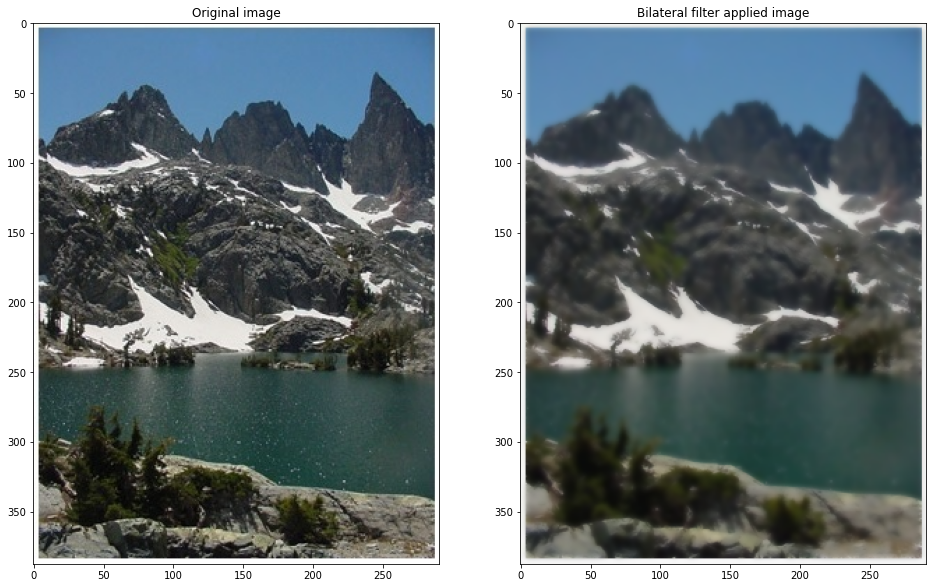

In [30]:
im = cv2.imread('../images/mountain.jpg')
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

fig = plt.figure(figsize=(16, 24))
ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(im)
ax1.set_title('Original image')

ax2 = fig.add_subplot(1, 2, 2)
ret = bilateral_filter(im, 11, 0.5, 0.01)
ax2.imshow(ret)
ax2.set_title('Bilateral filter applied image')

plt.show()

#### 2. In low light imaging, images tend to be noisy and lose sharp edges. However, with flash, there is an unpleasant direct-lighting effect. Here, a cross bilateral filter can be used with the range and spatial filters acting on two different images.

In [31]:
def cross_bilateral_filter(im1, im2, k, sigma_s, sigma_c):
    im1 = np.int32(im1)
    im2 = np.int32(im2)
    m, n, d = im1.shape
    
    im1 = np.vstack((np.zeros(((k-1)//2, n+k-1, d)), np.hstack((np.zeros((m, (k-1)//2, d)), im1, np.zeros((m, (k-1)//2, d)))), np.zeros(((k-1)//2, n+k-1, d))))
    im2 = np.vstack((np.zeros(((k-1)//2, n+k-1, d)), np.hstack((np.zeros((m, (k-1)//2, d)), im2, np.zeros((m, (k-1)//2, d)))), np.zeros(((k-1)//2, n+k-1, d))))
    
    tmp = np.tile(np.arange(k), (k, 1))
    gaussian_filt = np.exp(-((tmp - (k-1)//2)**2 + (tmp.T - (k-1)//2)**2)/2*(sigma_s**2))
    
    ret = np.zeros((m, n, d))
    for i in range(m):
        for j in range(n):
            for l in range(d):
                intensity_filt = np.exp(-(im1[i:i+k, j:j+k, l] - im1[i+(k-1)//2, j+(k-1)//2, l])**2/2*(sigma_c**2))
                new_filt = gaussian_filt*intensity_filt
                ret[i][j][l] = np.sum(new_filt*im2[i:i+k, j:j+k, l])/np.sum(new_filt)
                
    return np.uint8(ret)

#### 3. By combining a flash photograph cake-flash.jpg and a no-flash photograph cake-noflash.jpg, render a new photograph cake-out.jpg that has both the warm lighting of the no-flash picture and the crisp details of the flash image.

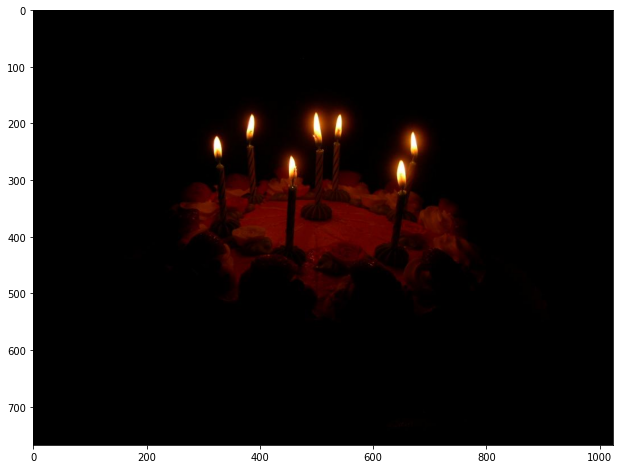

In [35]:
im1 = cv2.imread('../images/cake_flash.jpg')
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)
im2 = cv2.imread('../images/cake_noflash.jpg')
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)

ret = cross_bilateral_filter(im1, im2, 5, 200, 200)

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(111)
axs.imshow(ret)

plt.show()

# Question 4 (Cartoon effect)

---


In [33]:
def adaptive_threshold(im, k, d):
    im = np.int32(im)
    m, n = im.shape
    
    tmp = np.vstack((np.zeros(((k-1)//2, n+k-1)), np.hstack((np.zeros((m, (k-1)//2)), im, np.zeros((m, (k-1)//2)))), np.zeros(((k-1)//2, n+k-1))))
    
    ret = np.zeros((m, n), dtype=float)
    for i in range(m):
        for j in range(n):
            mean = np.sum(tmp[i:i+k, j:j+k])/(k**2) - d
            ret[i][j] = (im[i][j] >= mean)*255
            
    return np.uint8(ret)

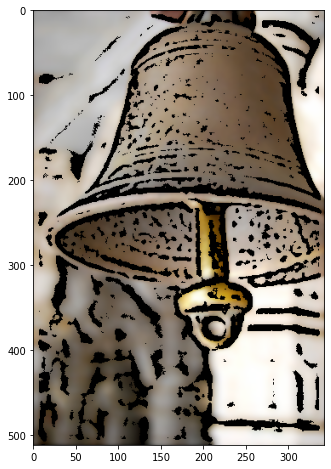

In [34]:
im = cv2.imread('../images/bell.jpg')
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

bil = bilateral_filter(im, 11, 0.5, 0.01)
grayscale = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)

mean_blur = mean_filter(grayscale, 5)
mask = adaptive_threshold(mean_blur, 11, 2)

res = np.zeros(im.shape, dtype=int)
res[:, :, 0] = mask & bil[:, :, 0]
res[:, :, 1] = mask & bil[:, :, 1]
res[:, :, 2] = mask & bil[:, :, 2]

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 1, 1)
axs.imshow(res)

plt.show()

# Question 5 (Fourier Transform)

---

#### 1. Implement 2D DFT

In [36]:
def DFT_2D(im):
    im = np.complex128(im)
    m, n = im.shape
    
    x, y = np.meshgrid(np.arange(m), np.arange(m))
    Wm = np.power(np.exp(-2*np.pi*1j/m), x*y)/np.sqrt(m)
    
    x, y = np.meshgrid(np.arange(n), np.arange(n))
    Wn = np.power(np.exp(-2*np.pi*1j/n), x*y)/np.sqrt(n)
    
    return np.matmul(np.matmul(Wm, im), Wn)

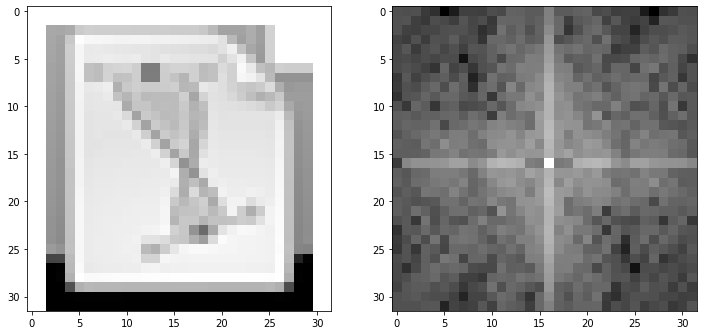

In [37]:
im = cv2.imread('../images/small.png')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

f = DFT_2D(im)

fshift = np.fft.fftshift(f)
mag = 20*np.log(np.abs(fshift))

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 2, 1)
axs.imshow(im, cmap='gray')

axs = fig.add_subplot(1, 2, 2)
axs.imshow(mag, cmap='gray')

plt.show()

#### 2. Implement 1D Fast Fourier Transform (Recursive Formulation). Use it to implement 2D FFT and display the result on suitable images of your choice. Compare the run times of your version of DFT and FFT on different sized inputs and plot them.

In [38]:
def FFT_1D(f):
    size = f.shape
    if size[0] % 2 != 0:
        ps = np.int32(np.power(2, np.ceil(np.log2(size[0])))) - size[0]
        f = np.vstack((f, np.zeros((ps, size[1]))))
    f = np.complex128(f)
    size = f.shape

    if size[0] == 1:
        return np.array([f[0]])
    
    F = np.zeros(size, dtype=complex)
    F_even = FFT_1D(f[0::2])
    F_odd = FFT_1D(f[1::2])

    mid = size[0] // 2
    
    i = np.arange(mid)
    ex = np.exp(-2*np.pi*1j*i/size[0]).reshape((mid, 1))
    
    odd = F_odd * ex
    F[0:mid] = F_even + odd
    F[mid:2*mid] = F_even - odd
    
    return F

def FFT_2D(im):
    im = np.complex128(im)
    m, n = im.shape
    
    ret = np.zeros((m, n), dtype=complex)
    ret = FFT_1D(im)
    ret = FFT_1D(ret.T).T
        
    return ret

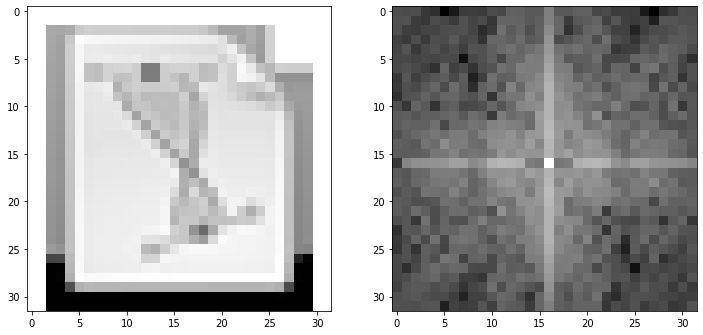

In [39]:
im = cv2.imread('../images/small.png')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
f = FFT_2D(im)

fshift = np.fft.fftshift(f)
mag = 20*np.log(np.abs(fshift)+1)

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 2, 1)
axs.imshow(im, cmap='gray')

axs = fig.add_subplot(1, 2, 2)
axs.imshow(mag, cmap='gray')

plt.show()

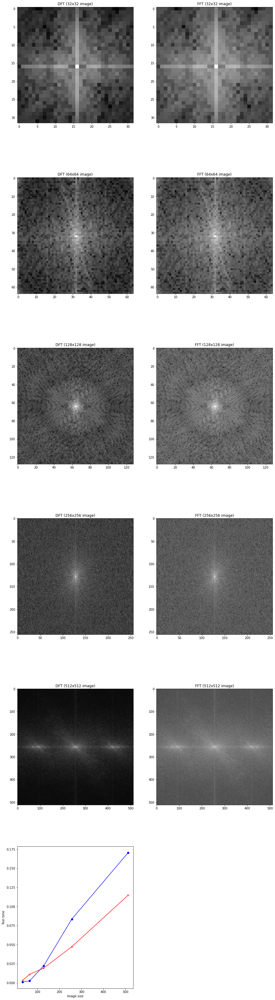

In [55]:
im_32 = cv2.imread('../images/small.png')
im_32 = cv2.cvtColor(im_32, cv2.COLOR_BGR2GRAY)

im_64 = cv2.imread('../images/sunset.png')
im_64 = cv2.cvtColor(im_64, cv2.COLOR_BGR2GRAY)

im_128 = cv2.imread('../images/fruit.png')
im_128 = cv2.cvtColor(im_128, cv2.COLOR_BGR2GRAY)

im_256 = cv2.imread('../images/nature.png')
im_256 = cv2.cvtColor(im_256, cv2.COLOR_BGR2GRAY)

im_512 = cv2.imread('../images/noisy_lena.png')
im_512 = cv2.cvtColor(im_512, cv2.COLOR_BGR2GRAY)

fig = plt.figure(figsize=(15, 60))

dft_rt = []
fft_rt = []

cur_time = time.time()
ret = DFT_2D(im_32)
dft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 1)
axs.imshow(mag, cmap='gray')
axs.set_title('DFT (32x32 image)')

cur_time = time.time()
ret = FFT_2D(im_32)
fft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 2)
axs.imshow(mag, cmap='gray')
axs.set_title('FFT (32x32 image)')

cur_time = time.time()
ret = DFT_2D(im_64)
dft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 3)
axs.imshow(mag, cmap='gray')
axs.set_title('DFT (64x64 image)')

cur_time = time.time()
ret = FFT_2D(im_64)
fft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 4)
axs.imshow(mag, cmap='gray')
axs.set_title('FFT (64x64 image)')

cur_time = time.time()
ret = DFT_2D(im_128)
dft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 5)
axs.imshow(mag, cmap='gray')
axs.set_title('DFT (128x128 image)')

cur_time = time.time()
ret = FFT_2D(im_128)
fft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 6)
axs.imshow(mag, cmap='gray')
axs.set_title('FFT (128x128 image)')

cur_time = time.time()
ret = DFT_2D(im_256)
dft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 7)
axs.imshow(mag, cmap='gray')
axs.set_title('DFT (256x256 image)')

cur_time = time.time()
ret = FFT_2D(im_256)
fft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 8)
axs.imshow(mag, cmap='gray')
axs.set_title('FFT (256x256 image)')

cur_time = time.time()
ret = DFT_2D(im_512)
dft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 9)
axs.imshow(mag, cmap='gray')
axs.set_title('DFT (512x512 image)')

cur_time = time.time()
ret = FFT_2D(im_512)
fft_rt.append(time.time() - cur_time)
fshift = np.fft.fftshift(ret)
mag = 20*np.log(np.abs(fshift)+1)
axs = fig.add_subplot(6, 2, 10)
axs.imshow(mag, cmap='gray')
axs.set_title('FFT (512x512 image)')

x = [32, 64, 128, 256, 512]
axs = fig.add_subplot(6, 2, 11)
axs.plot(x, dft_rt, marker='o', color='blue')
axs.plot(x, fft_rt, marker='x', color='red')
axs.set_xlabel('Image size')
axs.set_ylabel('Run time')

plt.show()

We can see from the plot that the recursive FFT performs better (lesser runtime) than the DFT. As the recursive FFT uses the idea of divide and conquer, it performs much better.

#### 3. Now, implement 2D Inverse FFT in a similar fashion.

In [41]:
def IDFT_2D(im):
    im = np.complex128(im)
    m, n = im.shape
    
    x, y = np.meshgrid(np.arange(m), np.arange(m))
    Wm = np.power(np.exp(2*np.pi*1j/m), x*y)/np.sqrt(m)
    
    x, y = np.meshgrid(np.arange(n), np.arange(n))
    Wn = np.power(np.exp(2*np.pi*1j/n), x*y)/np.sqrt(n)
    
    return np.matmul(np.matmul(Wm, im), Wn)

def IFFT_1D(f):
    size = f.shape
    if size[0] % 2 != 0:
        ps = np.int32(np.power(2, np.ceil(np.log2(size[0])))) - size[0]
        f = np.vstack((f, np.zeros((ps, size[1]))))
    f = np.complex128(f)
    size = f.shape

    if size[0] == 1:
        return np.array([f[0]])
    
    F = np.zeros(size, dtype=complex)
    F_even = IFFT_1D(f[0::2])
    F_odd = IFFT_1D(f[1::2])
    
    mid = size[0] // 2
    i = np.arange(mid)
    ex = np.exp(2*np.pi*1j*i/size[0]).reshape((mid, 1))
    
    odd = F_odd * ex
    F[0:mid] = F_even + odd
    F[mid:2*mid] = F_even - odd
        
    return F

def IFFT_2D(im):
    im = np.complex128(im)
    m, n = im.shape
    
    ret = IFFT_1D(im)
    ret = IFFT_1D(ret.T).T
    
    return ret

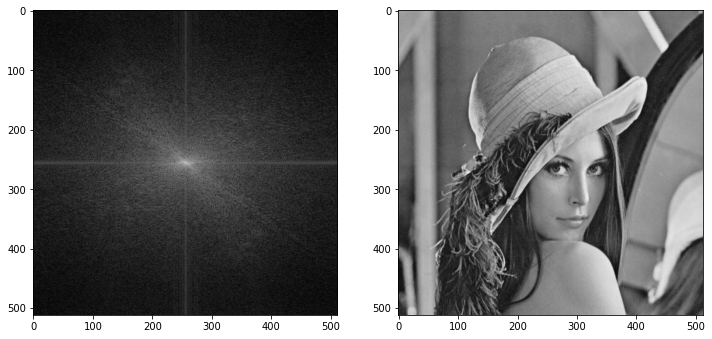

In [42]:
im = cv2.imread('../images/lena.jpg')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

im_fft = DFT_2D(im)
fshift = np.fft.fftshift(im_fft)
mag = 20*np.log(np.abs(fshift)+1)

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 2, 1)
axs.imshow(mag, cmap='gray')

im_ifft = IFFT_2D(im_fft)
axs = fig.add_subplot(1, 2, 2)
axs.imshow(np.abs(im_ifft), cmap='gray')

plt.show()

#### 4. Calculate the Fourier transform of the Fourier transform of any image. You would observe that the image you get is similar to the original image. How is it different from the original image? How can you fix this in the frequency domain so that we would get the original image back instead?

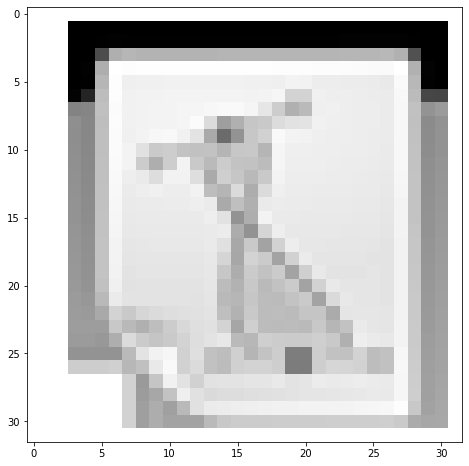

In [43]:
im = cv2.imread('../images/small.png')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

ret = DFT_2D(im)
ret = DFT_2D(ret)

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 1, 1)
axs.imshow(np.abs(ret), cmap='gray')

plt.show()

The image which we get after applying fourier transform to the fourier transform of the image is the rotated image which is rotated clockwise/anticlockwise by 180 degrees.

For fixing this, we can rotate the fourier transform of the image by 180 degrees and then apply fourier transform again, which gives us the original image back.

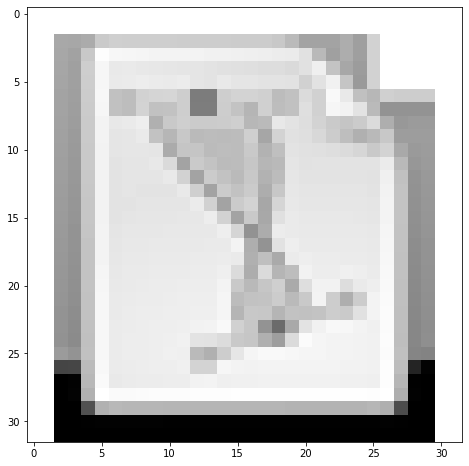

In [44]:
ret = DFT_2D(im)
ret = np.rot90(np.rot90(ret))
ret = DFT_2D(ret)

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 1, 1)
axs.imshow(np.abs(ret), cmap='gray')

plt.show()

# Question 6

---

#### 1. Compute IFT(F.H) and f * h. Check whether IFT(F.H) corresponds to the center portion of f * h. Compute the average of squared difference between pixel values in IFT(F.H) and the central 256 × 256 portion of f * h (F.H denotes point-wise multiplication of F and H and f * h denotes convolution with padding).

In [45]:
def convolve(im1, im2):
    im1 = np.int32(im1)
    im2 = np.int32(im2)
    im2 = np.flip(np.flip(im2, 0), 1)
    m1, n1 = im1.shape
    m2, n2 = im2.shape
    
    im1 = np.vstack((np.zeros((m2-1, n1+2*n2-2)), np.hstack((np.zeros((m1, n2-1)), im1, np.zeros((m1, n2-1)))), np.zeros((m2-1, n1+2*n2-2))))
    ret = np.zeros((m1+m2-1, n1+n2-1))
    
    for i in range(m1+m2-1):
        for j in range(n1+n2-1):
            ret[i][j] = np.sum(im1[i:i+m2, j:j+n2] * im2)
            
    return np.int64(ret)

Mean squared error: 235887321102.9794


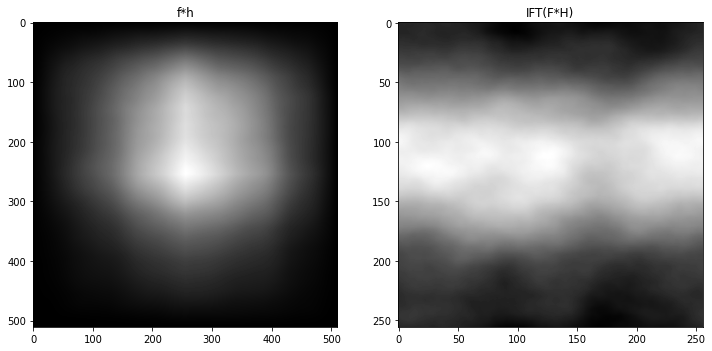

In [46]:
f = cv2.imread('../images/flowers.png')
f = cv2.cvtColor(f, cv2.COLOR_BGR2GRAY)

h = cv2.imread('../images/nature.png')
h = cv2.cvtColor(h, cv2.COLOR_BGR2GRAY)

F = FFT_2D(f)
H = FFT_2D(h)

fh = convolve(f, h)
FH_IFT = np.abs(IFFT_2D(F*H))

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 2, 1)
axs.set_title('f*h')
axs.imshow(fh, cmap='gray')

axs = fig.add_subplot(1, 2, 2)
axs.set_title('IFT(F*H)')
axs.imshow(FH_IFT, cmap='gray')

fhc = fh[127:383, 127:383]
mse = np.sqrt(np.sum((fhc - FH_IFT)**2)) / (256*256)
print('Mean squared error:', mse)

plt.show()

#### 2. What changes do you observe when you zero pad the original images to dimension (511 × 511) and now calculate IFT(F.H) and report the new error.

Mean squared error: 307604.08247865073


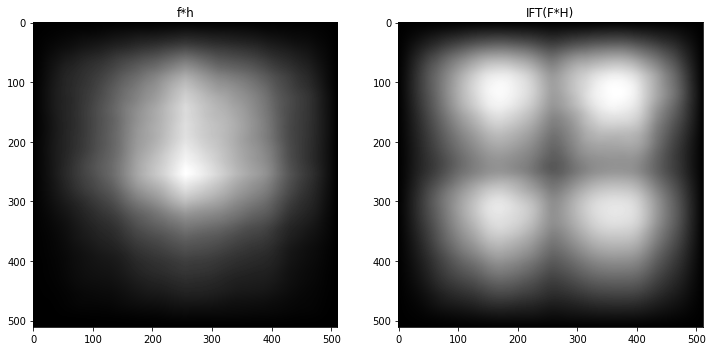

In [47]:
f_new = np.vstack((np.hstack((f, np.zeros((256, 255)))), np.zeros((255, 511))))
h_new = np.vstack((np.hstack((h, np.zeros((256, 255)))), np.zeros((255, 511))))

F_new = DFT_2D(f_new)
H_new = DFT_2D(h_new)

FH_IFT_new = np.abs(IFFT_2D(F_new*H_new))
FH_IFT_new = FH_IFT_new[:-1, :-1]

fig = plt.figure(figsize=(12, 8))
axs = fig.add_subplot(1, 2, 1)
axs.set_title('f*h')
axs.imshow(fh, cmap='gray')

axs = fig.add_subplot(1, 2, 2)
axs.set_title('IFT(F*H)')
axs.imshow(FH_IFT_new, cmap='gray')

mse = np.sqrt(np.sum((fh - FH_IFT_new)**2)) / (511 * 511)
print('Mean squared error:', mse)

plt.show()

We can see from above plots of FFT that the visualization of the transform domain representation of image is the same for all 4 images. But the only thing is that they have been scaled by the factor by which we changed the size of the image.

We can also comment about the inverse relation of spatial and frequency domain representaions. Scaling down an image in spatial domain is equivalent to scaling up the image in trandform domain.

#### 2. Choose any 64x64 image. Now, add 64 columns and rows of zeros to the right and bottom side of the original image. Repeat this process two more times each time doubling the image size and padding the pixels on the right and bottom by zeroes. You will therefore have 4 images first one 64 × 64 with no zero padding and then 128 × 128, 256 × 256 and 512 × 512 after padding. Find the Fourier transform of all these images. Display the results and explain and justify the relationship between the four outputs you get.

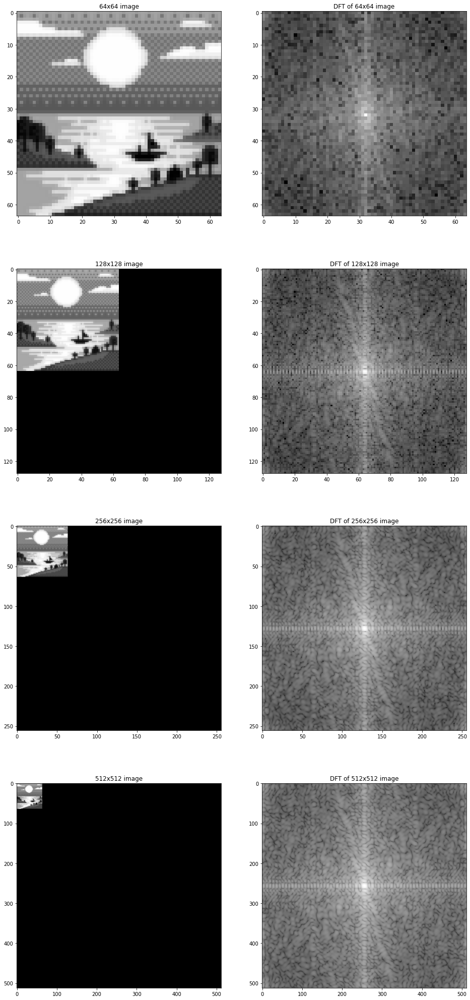

In [48]:
img64 = cv2.imread('../images/sunset.png')
img64 = cv2.cvtColor(img64, cv2.COLOR_BGR2GRAY)
img128 = np.vstack((np.hstack((img64, np.zeros((64, 64)))), np.zeros((64, 128))))
img256 = np.vstack((np.hstack((img128, np.zeros((128, 128)))), np.zeros((128, 256))))
img512 = np.vstack((np.hstack((img256, np.zeros((256, 256)))), np.zeros((256, 512))))

fig = plt.figure(figsize=(16, 36))
axs = fig.add_subplot(4, 2, 1)
axs.set_title('64x64 image')
axs.imshow(img64, cmap='gray')

dft_img64 = DFT_2D(img64)
fshift = np.fft.fftshift(dft_img64)
mag = 20*np.log(np.abs(fshift))
axs = fig.add_subplot(4, 2, 2)
axs.set_title('DFT of 64x64 image')
axs.imshow(mag, cmap='gray')

axs = fig.add_subplot(4, 2, 3)
axs.set_title('128x128 image')
axs.imshow(img128, cmap='gray')

dft_img128 = DFT_2D(img128)
fshift = np.fft.fftshift(dft_img128)
mag = 20*np.log(np.abs(fshift))
axs = fig.add_subplot(4, 2, 4)
axs.set_title('DFT of 128x128 image')
axs.imshow(mag, cmap='gray')

axs = fig.add_subplot(4, 2, 5)
axs.set_title('256x256 image')
axs.imshow(img256, cmap='gray')

dft_img256 = DFT_2D(img256)
fshift = np.fft.fftshift(dft_img256)
mag = 20*np.log(np.abs(fshift))
axs = fig.add_subplot(4, 2, 6)
axs.set_title('DFT of 256x256 image')
axs.imshow(mag, cmap='gray')

axs = fig.add_subplot(4, 2, 7)
axs.set_title('512x512 image')
axs.imshow(img512, cmap='gray')

dft_img512 = DFT_2D(img512)
fshift = np.fft.fftshift(dft_img512)
mag = 20*np.log(np.abs(fshift))
axs = fig.add_subplot(4, 2, 8)
axs.set_title('DFT of 512x512 image')
axs.imshow(mag, cmap='gray')

plt.show()

# Question 7 (Denoise)

---

#### Denoise the given image noisy-lena.png and explain your process.

In [49]:
def LPF(im, rad):
    m, n = im.shape
    
    i, j = np.meshgrid(np.arange(n), np.arange(m))
    filt = np.where(np.sqrt((j-m/2)**2 + (i-n/2)**2) <= rad, 1, 0)
    
    return im * filt, filt

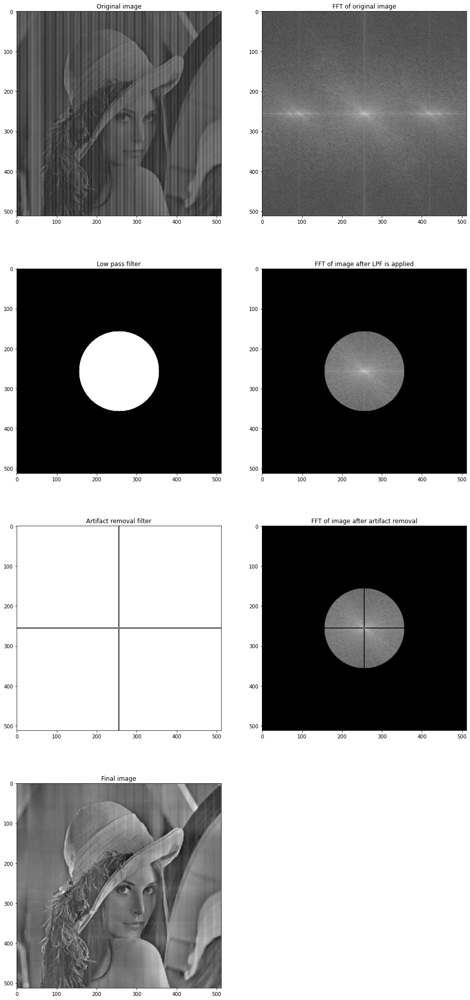

In [50]:
im = cv2.imread('../images/noisy_lena.png')
im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
m, n = im.shape

f = FFT_2D(im)

fshift = np.fft.fftshift(f)
mag = 20*np.log(np.abs(fshift)+1)

fshift_filt, filt = LPF(fshift, 100)
mag_filt = 20*np.log(np.abs(fshift_filt)+1)

mask = np.ones(im.shape)
mask[(m>>1)-1:(m>>1)+1, (n>>1)+1:] = 0
mask[(m>>1)-1:(m>>1)+1, :(n>>1)-1] = 0
mask[(m>>1)+1:, (n>>1)-1:(n>>1)+1] = 0
mask[:(m>>1)-1, (n>>1)-1:(n>>1)+1] = 0

fshift_filt_mask = mask * fshift_filt
mag_filt_mask = 20*np.log(np.abs(fshift_filt_mask)+1)

f_filt_mask = np.fft.ifftshift(fshift_filt_mask)

ret = np.abs(IFFT_2D(f_filt_mask))

fig = plt.figure(figsize=(16, 36))
axs = fig.add_subplot(4, 2, 1)
axs.imshow(im, cmap='gray')
axs.set_title('Original image')

axs = fig.add_subplot(4, 2, 2)
axs.imshow(mag, cmap='gray')
axs.set_title('FFT of original image')

axs = fig.add_subplot(4, 2, 3)
axs.imshow(filt, cmap='gray')
axs.set_title('Low pass filter')

axs = fig.add_subplot(4, 2, 4)
axs.imshow(mag_filt, cmap='gray')
axs.set_title('FFT of image after LPF is applied')

axs = fig.add_subplot(4, 2, 5)
axs.imshow(mask, cmap='gray')
axs.set_title('Artifact removal filter')

axs = fig.add_subplot(4, 2, 6)
axs.imshow(mag_filt_mask, cmap='gray')
axs.set_title('FFT of image after artifact removal')

axs = fig.add_subplot(4, 2, 7)
axs.imshow(ret, cmap='gray')
axs.set_title('Final image')

plt.show()

#### Process of obtaining the above denoised image from noisy image

* FFT
    * On applying FFT on noisy image we get the fourier transform of the image
    * We can perform some operations in frequency domain
* FFT shift
    * Doing this will bring zero-frequency component to centre
* Low Pass Filter (LPF)
    * This filter will retain only low frequencies which are present at centre of FFT
    * We create a mask to retain only low frequencies and eliminate high frequencies which are part of noise
    * For this image, radius taken for LPF is 80 pixels
* Artifact removal
    * As some frequencies along x and y direction are retained, we apply artifact removal
    * This removes all unwanted frequencies which are along x and y directions
* FFT inverse shift
    * This shifts back the zero frequency component from centre back to boundary
* IFFT
    * On applying IFFT on FFT of image, we get back the image in spatial domain